# 測試 paddleocr 官方模型的效果 - 中文識別

https://github.com/PaddlePaddle/PaddleOCR/blob/release/2.5/doc/doc_ch/inference_ppocr.md
https://github.com/PaddlePaddle/PaddleOCR/blob/release/2.5/doc/doc_ch/recognition.md

- Version: 2.5.0.3
- Home-page: https://github.com/PaddlePaddle/PaddleOCR

In [81]:
!pip show paddleocr

Name: paddleocr
Version: 2.5.0.3
Summary: Awesome OCR toolkits based on PaddlePaddle （8.6M ultra-lightweight pre-trained model, support training and deployment among server, mobile, embeded and IoT devices
Home-page: https://github.com/PaddlePaddle/PaddleOCR
Author: 
Author-email: 
License: Apache License 2.0
Location: /usr/local/python3.7.0/lib/python3.7/site-packages
Requires: attrdict, cython, imgaug, lmdb, lxml, numpy, opencv-contrib-python, openpyxl, premailer, pyclipper, python-Levenshtein, scikit-image, shapely, tqdm, visualdl
Required-by: 


In [1]:
%cd /workspace/Bibi_orchid/str/

/workspace/Bibi_orchid/str


In [8]:
import cv2
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

### 命令列跑法

In [2]:
!paddleocr --image_dir ./testdata/1.jpg --use_angle_cls true 

grep: warning: GREP_OPTIONS is deprecated; please use an alias or script
[2022/06/15 16:22:21] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/ch/ch_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_

In [3]:
!paddleocr --image_dir ./testdata/ct1.jpg --use_angle_cls true --ocr_version PP-OCR --lang chinese_cht

grep: warning: GREP_OPTIONS is deprecated; please use an alias or script
[2022/06/15 16:34:31] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/ml/Multilingual_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', 

In [18]:
%cd PaddleOCR/

/workspace/Bibi_orchid/str/PaddleOCR


### pylibrary跑法

[2022/06/15 17:02:48] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/ch/ch_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_mode='f

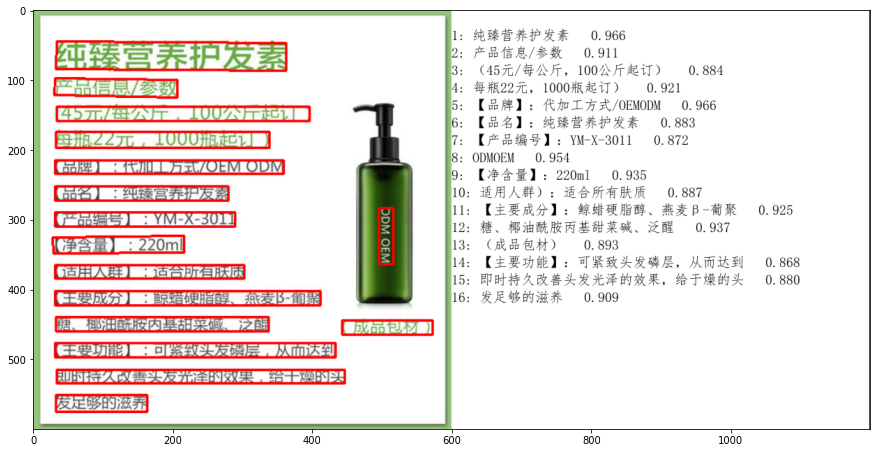

In [24]:
from paddleocr import PaddleOCR, draw_ocr
import matplotlib.pyplot as plt
%matplotlib inline

ocr = PaddleOCR(use_angle_cls=True, lang="ch", use_gpu=False)  # need to run only once to download and load model into memory
img_path = '/workspace/Bibi_orchid/str/PaddleOCR/doc/imgs/11.jpg'
result = ocr.ocr(img_path, cls=True)
for line in result:
    print(line)

from PIL import Image
image = Image.open(img_path).convert('RGB')
boxes = [line[0] for line in result]
txts = [line[1][0] for line in result]
scores = [line[1][1] for line in result]
im_show = draw_ocr(image, boxes, txts, scores, font_path='/workspace/Bibi_orchid/str/PaddleOCR/doc/fonts/simfang.ttf')
plt.figure(figsize=(15, 8))
plt.imshow(im_show)
plt.show()

[2022/06/15 18:15:24] ppocr DEBUG: Namespace(alpha=1.0, benchmark=False, beta=1.0, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_fce_box_type='poly', det_limit_side_len=960, det_limit_type='max', det_model_dir='/root/.paddleocr/whl/det/ml/Multilingual_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_box_type='quad', det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgn

grep: warning: GREP_OPTIONS is deprecated; please use an alias or script


[2022/06/15 18:15:24] ppocr WARNING: Since the angle classifier is not initialized, the angle classifier will not be uesd during the forward process


grep: warning: GREP_OPTIONS is deprecated; please use an alias or script


[2022/06/15 18:15:24] ppocr DEBUG: dt_boxes num : 18, elapse : 0.03466200828552246
[2022/06/15 18:15:24] ppocr DEBUG: rec_res num  : 18, elapse : 0.039762258529663086
[[[379.0, 215.0], [583.0, 162.0], [593.0, 199.0], [389.0, 252.0]], ('東和國際大樓', 0.8300283551216125)]
[[[386.0, 391.0], [575.0, 366.0], [581.0, 409.0], [392.0, 434.0]], ('印富邦人壽', 0.8297675848007202)]
[[[391.0, 505.0], [575.0, 482.0], [580.0, 520.0], [396.0, 543.0]], ('寳華南產險', 0.8299118876457214)]
[[[414.0, 650.0], [547.0, 637.0], [550.0, 671.0], [418.0, 684.0]], ('健康吉美診所', 0.9467036724090576)]
[[[384.0, 767.0], [575.0, 761.0], [576.0, 798.0], [385.0, 803.0]], ('康和證券', 0.9454018473625183)]
[[[403.0, 829.0], [564.0, 835.0], [561.0, 904.0], [401.0, 898.0]], ('EIBC', 0.9965478777885437)]
[[[523.0, 911.0], [545.0, 911.0], [545.0, 923.0], [523.0, 923.0]], ('H.', 0.7979650497436523)]
[[[388.0, 1006.0], [579.0, 1023.0], [575.0, 1061.0], [385.0, 1044.0]], ('康和投顧', 0.9339693784713745)]
[[[118.0, 1363.0], [275.0, 1363.0], [275.0, 1389.

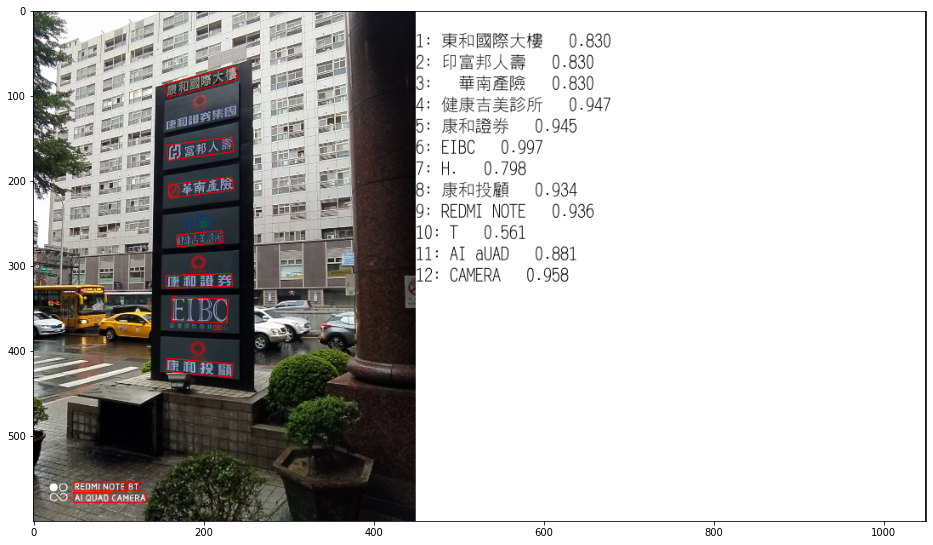

In [71]:
from paddleocr import PaddleOCR, draw_ocr

# 同样也是通过修改 lang 参数切换语种
ocr = PaddleOCR(lang="chinese_cht") # chinese_cht# 首次执行会自动下载模型文件
img_path = "/workspace/Bibi_orchid/str/test2/k1.jpg"
result = ocr.ocr(img_path)
# 可通过参数控制单独执行识别、检测
# result = ocr.ocr(img_path, det=False) 只执行识别
# result = ocr.ocr(img_path, rec=False) 只执行检测
# 打印检测框和识别结果
for line in result:
    print(line)

# 可视化
from PIL import Image
image = Image.open(img_path).convert('RGB')
boxes = [line[0] for line in result]
txts = [line[1][0] for line in result]
scores = [line[1][1] for line in result]
im_show = draw_ocr(image, boxes, txts, scores, font_path='/workspace/Bibi_orchid/str/PaddleOCR/doc/fonts/chinese_cht.ttf')
im_show = Image.fromarray(im_show)
im_show.save('res_k1.jpg')
plt.figure(figsize=(16, 16))
plt.imshow(im_show)
plt.show()


In [59]:
#--- model list
# det1:ch_ppocr_server_v2.0_det_infer
# det2:ml_PP-OCRv3_det_infer

# rec1:ch_ppocr_server_v2.0_rec_infer
# rec2:chinese_cht_mobile_v2.0_rec_infer

In [60]:
!python3 ./tools/infer/predict_system.py\
--image_dir="/workspace/Bibi_orchid/str/test2/ct1.jpg" \
--det_model_dir="/workspace/Bibi_orchid/str/PaddleOCR_pub/inference/ch_ppocr_server_v2.0_det_infer/" \
--rec_model_dir="/workspace/Bibi_orchid/str/PaddleOCR_pub/inference/ch_ppocr_server_v2.0_rec_infer" \
--use_angle_cls=false \
--rec_image_shape='3,32,320'\


grep: warning: GREP_OPTIONS is deprecated; please use an alias or script
grep: warning: GREP_OPTIONS is deprecated; please use an alias or script
grep: warning: GREP_OPTIONS is deprecated; please use an alias or script
[2022/06/15 18:10:57] ppocr INFO: In PP-OCRv3, rec_image_shape parameter defaults to '3, 48, 320', if you are using recognition model with PP-OCRv2 or an older version, please set --rec_image_shape='3,32,320
[2022/06/15 18:10:58] ppocr DEBUG: dt_boxes num : 4, elapse : 0.8675768375396729
[2022/06/15 18:10:58] ppocr DEBUG: rec_res num  : 4, elapse : 0.009751558303833008
[2022/06/15 18:10:58] ppocr DEBUG: 0  Predict time of /workspace/Bibi_orchid/str/test2/ct1.jpg: 0.879s
[2022/06/15 18:10:58] ppocr DEBUG: car, 0.881
[2022/06/15 18:10:58] ppocr DEBUG: 中, 0.786
[2022/06/15 18:10:58] ppocr DEBUG: 中國信托银行, 0.793
[2022/06/15 18:10:58] ppocr DEBUG: The visualized image saved in ./inference_results/ct1.jpg
[2022/06/15 18:10:58] ppocr INFO: The predict total time is 0.930553913116

### 成果展示(det2+rec2)

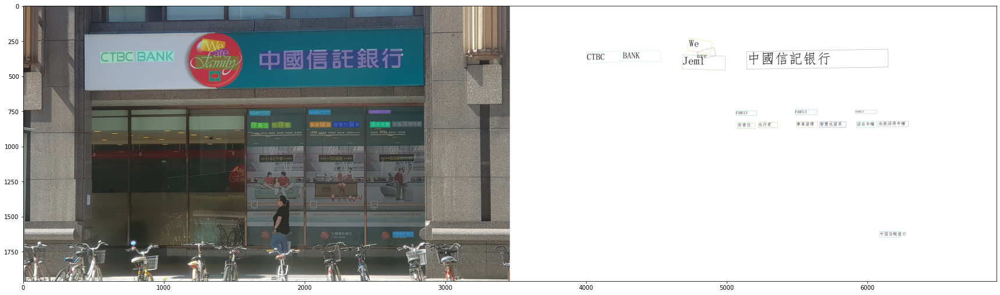

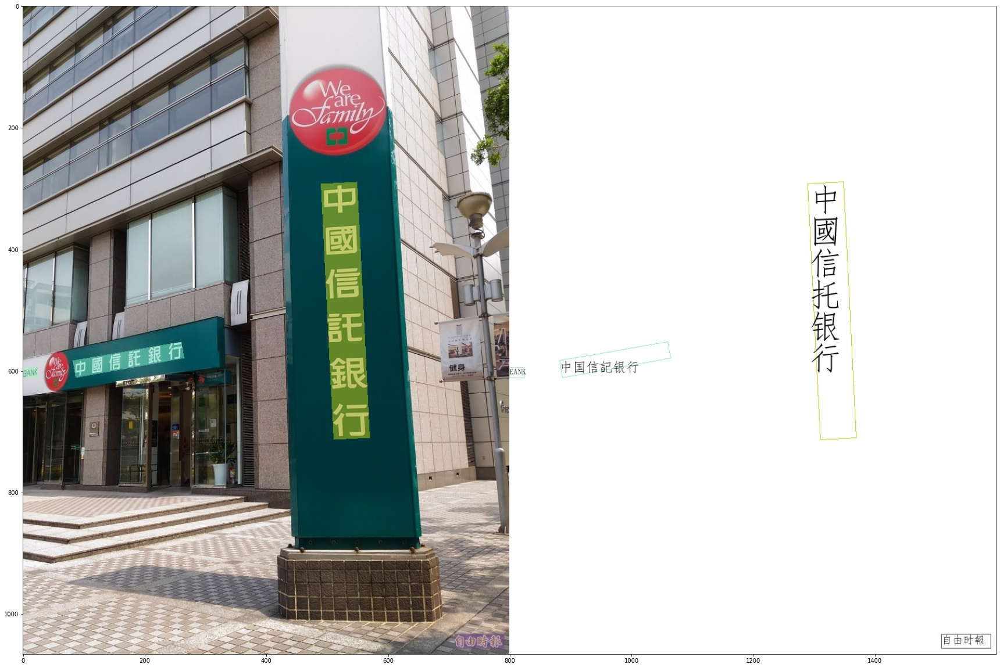

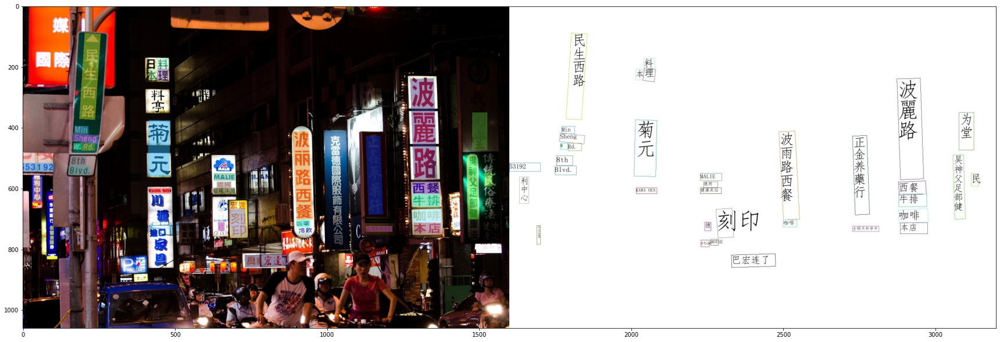

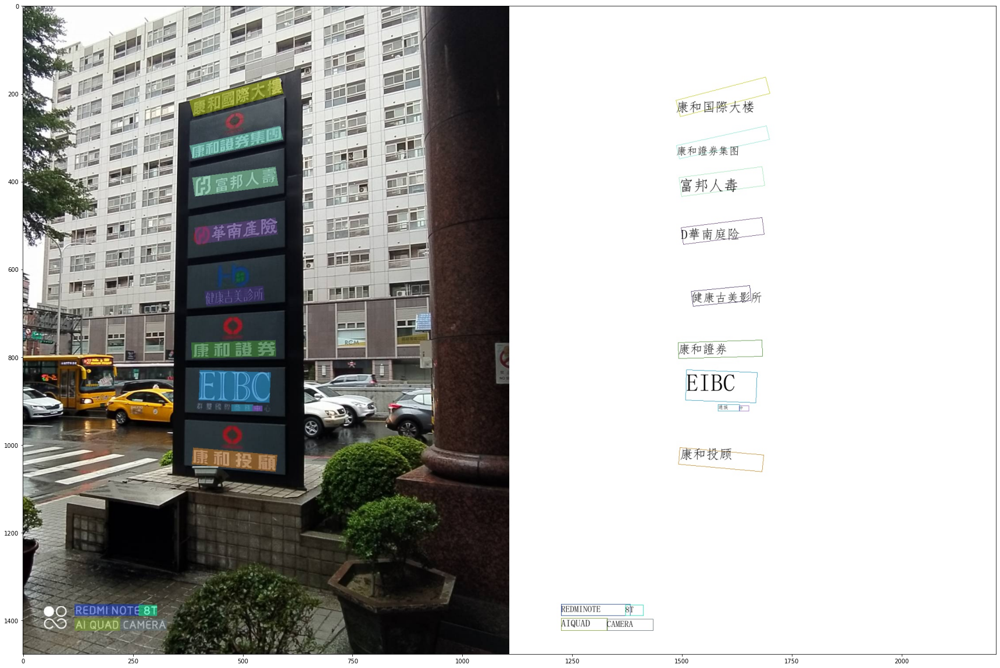

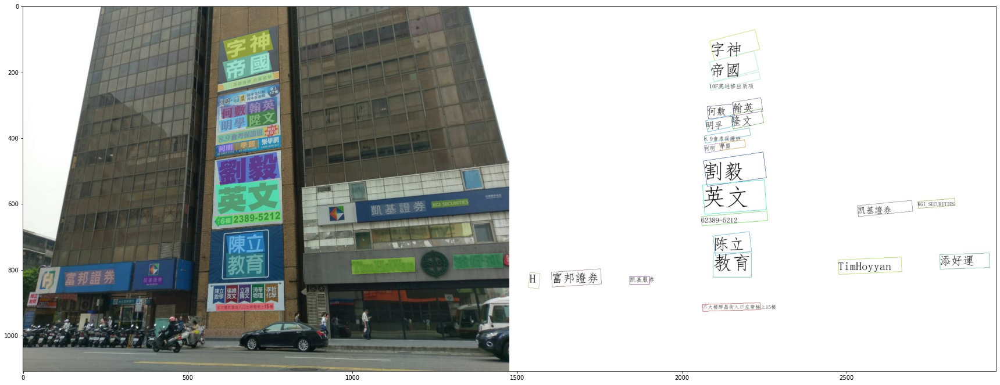

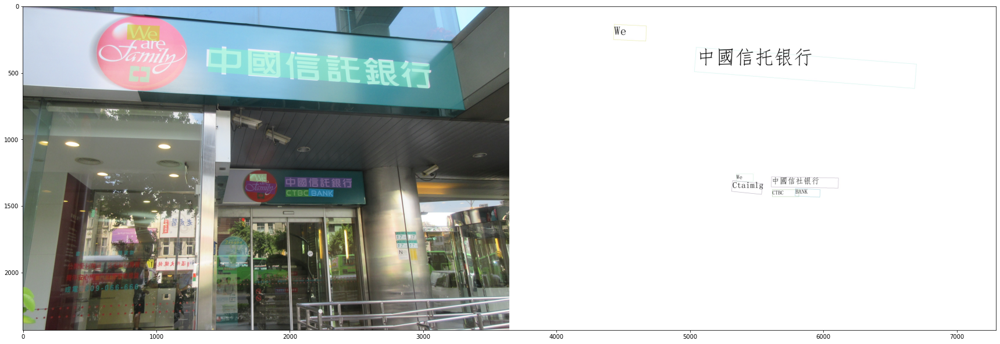

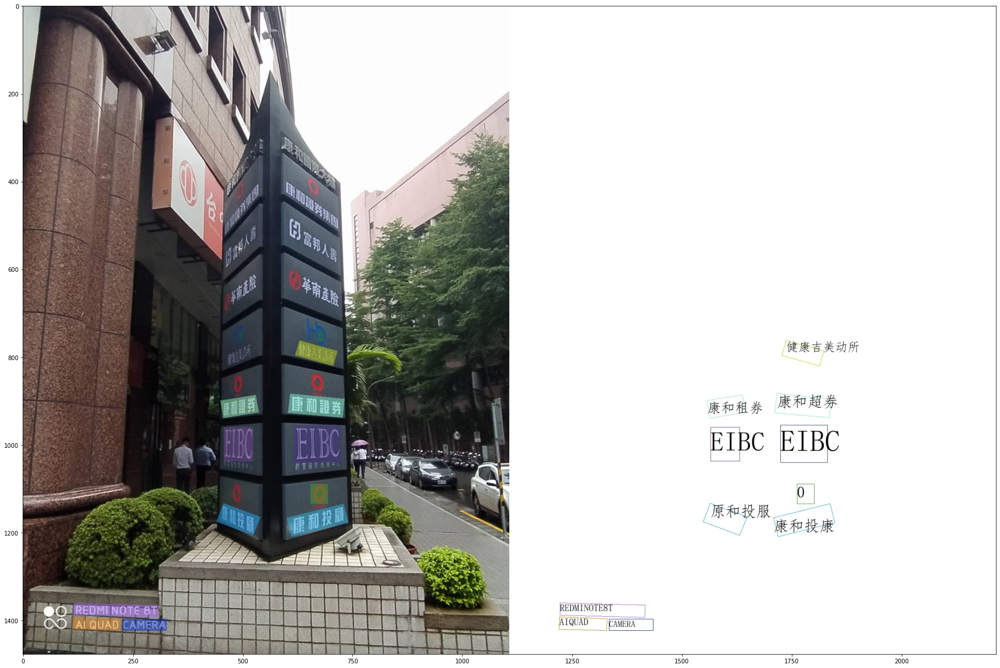

In [80]:
import os
res_dir_path ="/workspace/Bibi_orchid/str/PaddleOCR/inference_results/rec_d2r2_/"
for i in os.listdir(res_dir_path):
    img = Image.open(res_dir_path + i)
    img = np.array(img)
    plt.figure(figsize=(30, 30))
    plt.imshow(img)